In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import cm, image
%matplotlib inline
from IPython.display import Image
import PIL as PIL

## Lecture PCA

### Learning objectives

- Learn how to do image compression
- Learn about Principal Component Analysis (PCA)
- Understand how PCA can be applied to a dataset
- More learning objectives...

### To dos:
- Make it shorter? Probably necessary. 
- Get some consistency for full vs reduced svd - why introduce if not using? 
- Highlight smaller storage for image compression - this is the whole point!
- Make explanation of PCA more accessible - it has too much linear algebra right now. Boring and unaccessible for those who don't love numerical linear algebra like I do.
- Comment the PCA code better. 
- I've written PCA section in "PCA language", i.e. using eig() rather than svd(), but svd is what I explain earlier. Either re-write to use svd, or explain eig. 
- How to handle the x and y axes being "pixels"?
- Triple check for typos
- References

### Melt ponds 

Melt ponds, also called supraglacial lakes, are bodies of water that form on the surface of a glacier or an ice sheet. During the Antarctic summer melt season, between November and February, meltwater accumulates in hollows and cracks on the ice sheet. These melt ponds are important because meltwater has a lower *albedo* than ice, so they can locally increase surface melt in a positive feedback loop. Also, while melt ponds will often refreeze at the end of the melt season, they can sometimes drain through to the ice sheet bed, which can cause basal sliding and short-term acceleration of the ice sheet. Finally, melt ponds can cause hydrofracture, a process which occurs when meltwater fills and expands vertical crevasses, triggering fracturing. Hydrofracture can lead to ice sheet disintegration (cite Fricker et al, 2020). 

The impacts of melt ponds on ice sheets are not fully understood. Since these melt ponds exist in very remote areas, satellite remote sensing is the most realistic and useful tool to gather information for analysis of melt ponds. 

### Satellite data 

#### Sentinel-2 satellites
The Sentinel-2 mission consists of a pair of two identical satellites, Sentinel-2A and Sentinel-2B. Both of these satellites carry a high-resolution multispectral imager (MSI) instrument with 13 spectral bands (USGS EROS Archive). Part of the ESA's Copernicus program, the Sentinel-2A satellite was launched in June 2015, with the Sentinel-2B satellite launched in March 2017. These two satellites operate in a sun-synchronous orbit, phased 180$^\circ$ from each other, at a mean altitude of 786 km (ESA). The Sentinel-2 satellites have a repeat cycle of 10 days (meaning they collect images of the same location on the Earth every 10 days) and provide data from a 290-km wide swath with either 60 m, 20 m, or 10 m resolution. 

#### Data product and retrieval
The data collected by Sentinel-2 is freely available; we can retrieve it using the Copernicus Open Access Hub. In this notebook, we will use the Level-2A data product, which consists of bottom-of-atmosphere reflectances that are already orthorectified and map-projected and do not need additional preprocessing. For this example, I retrieved data gathered above Amery Ice Shelf in Antarctica that shows melt ponds studied by Fricker et al. (2020). 

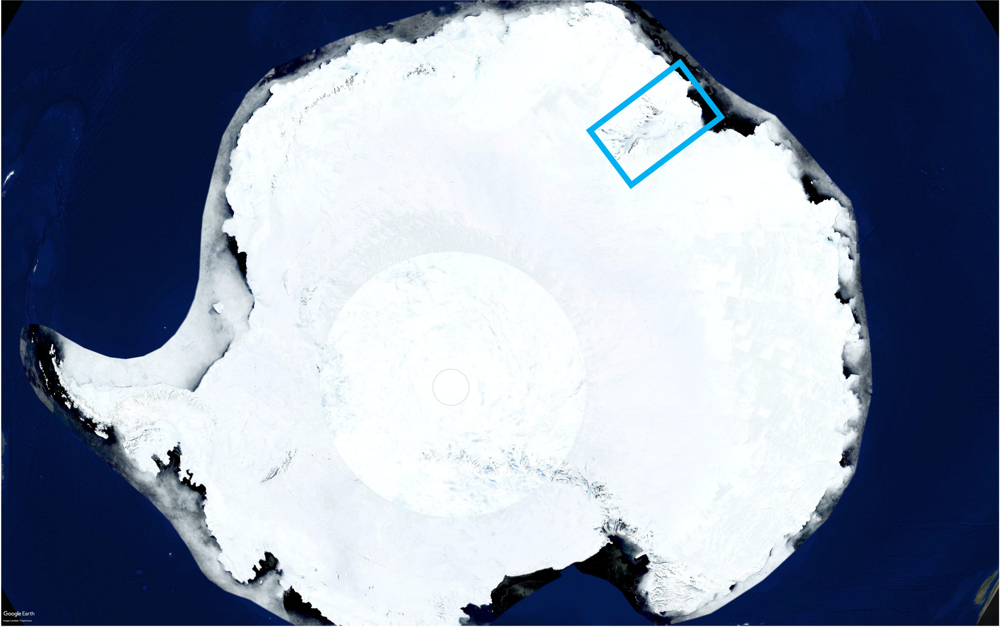

In [13]:
Image(filename='where_is_amery_antarctica.png')

### Loading and trimming the satellite data 

First we load in the data. The 13 bands are stored in separate .csv files, and we can load those into an array. It's a lot of data, so this cell can take a while to run. 

In [14]:
filepaths = ["AOT_data.csv","b2_data.csv","b3_data.csv",\
             "b4_data.csv","b5_data.csv","b6_data.csv",\
             "b7_data.csv","b8A_data.csv","b11_data.csv",\
             "b12_data.csv","SCL_data.csv","TCI_data.csv",\
             "WVP_data.csv"]
data_full = np.zeros((np.shape(pd.read_csv(filepaths[0]))[0],np.shape(pd.read_csv(filepaths[0]))[1],13))
for k in range((len(filepaths))):
    data_full[:,:,k] = pd.read_csv(filepaths[k]).values

We should check the size of the data array we've created. 

In [15]:
print(np.shape(data_full)) 

(1739, 1837, 13)


Now we can plot the RGB bands of the data, to take a look at what we have. From the documentation (cite) we know that the red, green and blue bands are stored in bands 4, 3, and 2 respectively. 

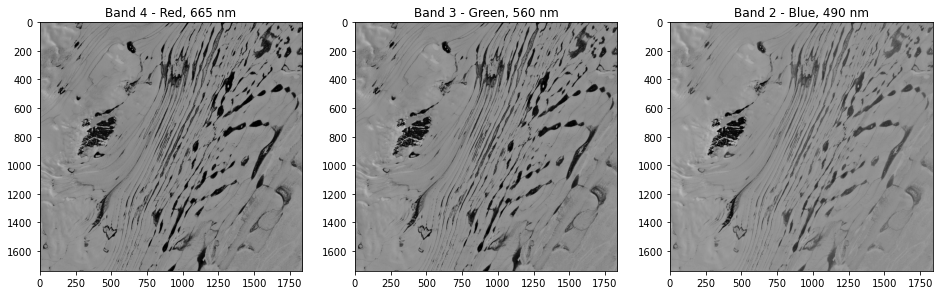

In [16]:
plt.figure(figsize=(16,8))
plt.subplot(1,3,1)
plt.imshow(data_full[:,:,4],cmap=cm.gray)
plt.title('Band 4 - Red, 665 nm')
plt.subplot(1,3,2)
plt.imshow(data_full[:,:,3],cmap=cm.gray)
plt.title('Band 3 - Green, 560 nm')
plt.subplot(1,3,3)
plt.imshow(data_full[:,:,2],cmap=cm.gray)
plt.title('Band 2 - Blue, 490 nm')
plt.show()

These bands look quite similar, and we can tell that there is both areas of ice (lighter grey areas) and areas that are not ice (darker grey/black areas) in the image. But at a glance, we don't know what those darker areas are. 

To simplify our analysis a bit, let's look at one specific area of the data. ICESat 2 data (cite Fricker et al.)
tells us that there is a melt pond here, and we want to examine this melt pond in our analysis later.  

(400, 400, 13)


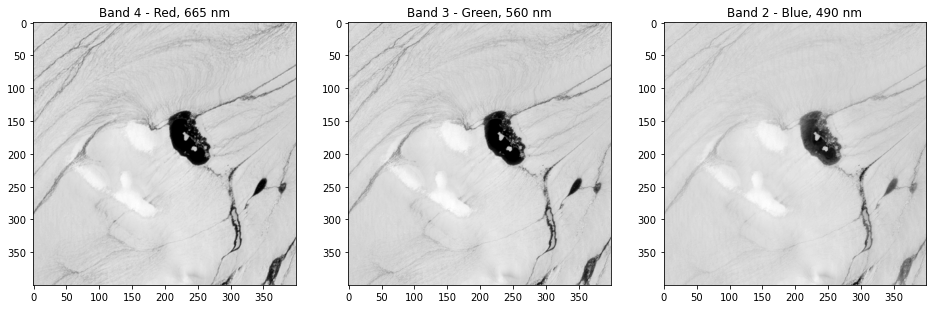

In [17]:
data = data_full[0:400,400:800,:]
print(data.shape)

plt.figure(figsize=(16,8))
plt.subplot(1,3,1)
plt.imshow(data[:,:,4],cmap=cm.gray)
plt.title('Band 4 - Red, 665 nm')
plt.subplot(1,3,2)
plt.imshow(data[:,:,3],cmap=cm.gray)
plt.title('Band 3 - Green, 560 nm')
plt.subplot(1,3,3)
plt.imshow(data[:,:,2],cmap=cm.gray)
plt.title('Band 2 - Blue, 490 nm')
plt.show()

Wow, now we can see this melt pond close up! We can also see some features of the ice sheet. 

### Efficient image compression using the SVD

Images are a common example of a large data set that we may wish to compress. The idea behind this is that an image is a large data set containing patterns that we can represent with a much smaller amount of data. (Some of you may have encountered image compression before in daily life, if you've emailed or texted a picture to someone and found that the image was compressed (and the quality lowered) so that the image would fit in the message). 

We can perform image compression by organizing our image data as a matrix with elements corresponding to pixels. Then we can take the Singular Value Decomposition (SVD) of this matrix. But what is the SVD?

#### Singular Value Decomposition (SVD)

The SVD is a type of **matrix decomposition**, which is where a matrix is factorized into a product of matrices. If we have a data matrix $\mathbf{X}$, we can compute the singular value decomposition to factorize $\mathbf{X}$ into three matrices, $\mathbf{X} = \mathbf{U} \mathbf{\Sigma} \mathbf{V^T}$. The columns of the matrix $\mathbf{U}$ are the left **singular vectors** of $\mathbf{X}$, and the columns of the matrix $\mathbf{V}$ are the right **singular vectors** of $\mathbf{X}$. Also, $\mathbf{\Sigma}$ is a diagonal matrix that contains the **singular values** of $\mathbf{X}$. 

We can use the `numpy.linalg.svd()` function to compute the SVD. We have two options: we can perform the **Full SVD**, or if the data matrix $\mathbf{X}$ is rectangular, we can compute the **Reduced SVD** which is quicker. In the following examples, we will use the full SVD by passing the option `full_matrices = 1`, or the reduced SVD by passing the option `full_matrices = 0`, into `numpy.linalg.svd()`. 

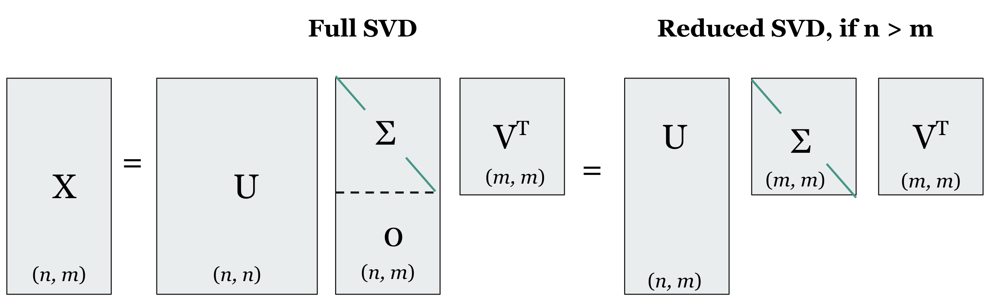

In [21]:
Image(filename='full_and_reduced_SVD.png')

Figure adapted from S. Brunton and N. Kutz, Data Driven Science and Engineering, 2019. Chapter 1, SVD.

One nice property of the SVD is that it is guaranteed to exist for any matrix. If we want to compress an image, we can store that image data as a matrix and then compute the SVD. We then create an approximation of the image of rank $r$ by multiplying the first $r$ left singular vectors (i.e. the first $r$ columns of $\mathbf{U}$) with the first $r$ singular values (i.e. the first $r$ columns of $\mathbf{\Sigma}$) and the first $r$ right singular vectors (i.e. the first $r$ columns of $\mathbf{V}$). So our approximated image matrix $\mathbf{X_r}$ can be expressed:

$\mathbf{X_r} = \mathbf{U_r} \mathbf{\Sigma_r} \mathbf{V_r^T}$. 

#### Compressing Amery Ice Sheet data

Let's apply image compression to one of the bands of our Amery Ice Sheet data. We'll choose the red band, but we could perform this process on any bands, or indeed any picture we wished. 

In [22]:
red_band = data[:,:,4] # pull our band 4, red
red_band.shape # check what size it is

(400, 400)

So we have our image data in a matrix (a numpy array). Now we can take the SVD to obtain the singular values and singular vectors we need to use for our reconstructions. 

In [26]:
U,Sigma,Vt = np.linalg.svd(red_band,full_matrices=1)
print('U is of size: ',np.shape(U))
print('Sigma is of size: ',np.shape(Sigma))
print('V^T is of size: ',np.shape(Vt))

U is of size:  (400, 400)
Sigma is of size:  (400,)
V^T is of size:  (400, 400)


In [24]:
# Include sigma decay plot?

We're going to want to do image compression a few times at different ranks $r$ of approximation, so writing a function will be helpful. In `image_approximation`, we compute `frac`, which is the fraction of the variability of the data matrix that is explained by the approximation. The higher the fraction, the more variability is being explained - ideally, we would like a high fraction with a low rank $r$ approximation. 

In [36]:
def image_approximation(data_in, r, full_or_red):
    '''
    Include docstring!
    '''
    U,Sigma,Vt = np.linalg.svd(data_in,full_matrices=full_or_red)
    Xr = np.zeros((np.shape(data_in)[0],np.shape(data_in)[1]))
    U_r = U[:,0:r]
    Sigma_r = np.diag(Sigma[0:r])
    Vt_r = Vt[0:r,:]
    Xr = np.matmul(np.matmul(U_r,Sigma_r),Vt_r)
    frac = np.sum(Sigma[0:r]**2)/np.sum(Sigma**2)
    return Xr, frac

In [37]:
# let's make approximations of the following ranks:
r_vals = [1,10,50,100,len(Sigma)]
# we should initialize arrays full of zeros in which to store our results
Xr = np.zeros((np.shape(red_band)[0],np.shape(red_band)[1],len(r_vals)))
frac = np.zeros(len(r_vals))
# now we iterate through the r_vals
for i in range(len(r_vals)):
    r = r_vals[i]
    Xr[:,:,i],frac[i] = image_approximation(red_band, r, 1)

Now that we've computed a few different approximations, let's take a look at the results. 

Even our very low rank approximations are explaining over 97% of the variability in the image. (NOTE: this seems suspiciously high?)

It makes sense that the fraction is one for our rank 400 approximation, because if we use all 400 singular values and singular vectors, we are recovering our original matrix and in fact not approximating at all. But it's always good to check this. 

In [39]:
print(frac)

[0.97631128 0.99556126 0.99894278 0.99967497 1.        ]


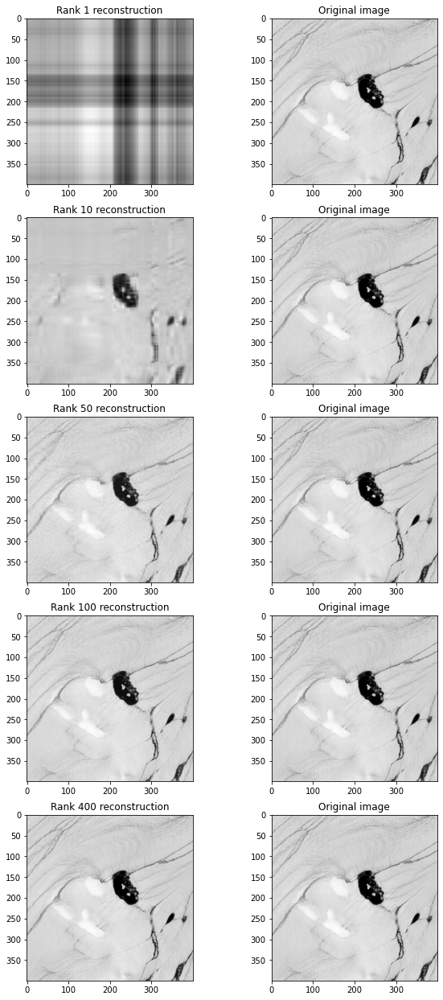

In [40]:
plt.figure(figsize=(10,22))
plt.subplot(5,2,1)
plt.imshow(Xr[:,:,0],cmap=cm.gray)
plt.title('Rank 1 reconstruction')
plt.subplot(5,2,2)
plt.imshow(red_band,cmap=cm.gray)
plt.title('Original image')

plt.subplot(5,2,3)
plt.imshow(Xr[:,:,1],cmap=cm.gray)
plt.title('Rank 10 reconstruction')
plt.subplot(5,2,4)
plt.imshow(red_band,cmap=cm.gray)
plt.title('Original image')

plt.subplot(5,2,5)
plt.imshow(Xr[:,:,2],cmap=cm.gray)
plt.title('Rank 50 reconstruction')
plt.subplot(5,2,6)
plt.imshow(red_band,cmap=cm.gray)
plt.title('Original image')

plt.subplot(5,2,7)
plt.imshow(Xr[:,:,3],cmap=cm.gray)
plt.title('Rank 100 reconstruction')
plt.subplot(5,2,8)
plt.imshow(red_band,cmap=cm.gray)
plt.title('Original image')

plt.subplot(5,2,9)
plt.imshow(Xr[:,:,4],cmap=cm.gray)
plt.title('Rank 400 reconstruction')
plt.subplot(5,2,10)
plt.imshow(red_band,cmap=cm.gray)
plt.title('Original image')


plt.imshow(Xr[:,:,len(k_vals)-1],cmap=cm.gray)

#### Compressing a different image

Now let's see how image compression works on a different image. We'll use `PIL.Image.open` to load in the Google Earth image of Antarctica we saw earlier. 

<class 'numpy.ndarray'>


(3013, 4800, 3)

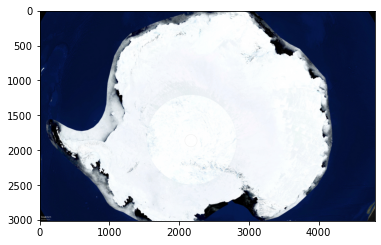

In [46]:
img_rgb = PIL.Image.open('where_is_amery_v3.jpg')
plt.imshow(img_rgb)

img = np.array(img_rgb)
print(type(img))
img.shape

In [47]:
np.max(img)

255

Let's pull out the RBG bands so we can approximate them. 

In [53]:
img_r = img[:,:,0]
img_g = img[:,:,1]
img_b = img[:,:,2]

Now we want to take the SVD and form approximations of different resolutions, for each of our bands.

Let's start with a rank 1 approximation. 

In [58]:
r = 1
Xr_red,frac_r = image_approximation(img_r, r, 1)
Xr_green,frac_g = image_approximation(img_g, r, 1)
Xr_blue,frac_b = image_approximation(img_b, r, 1)

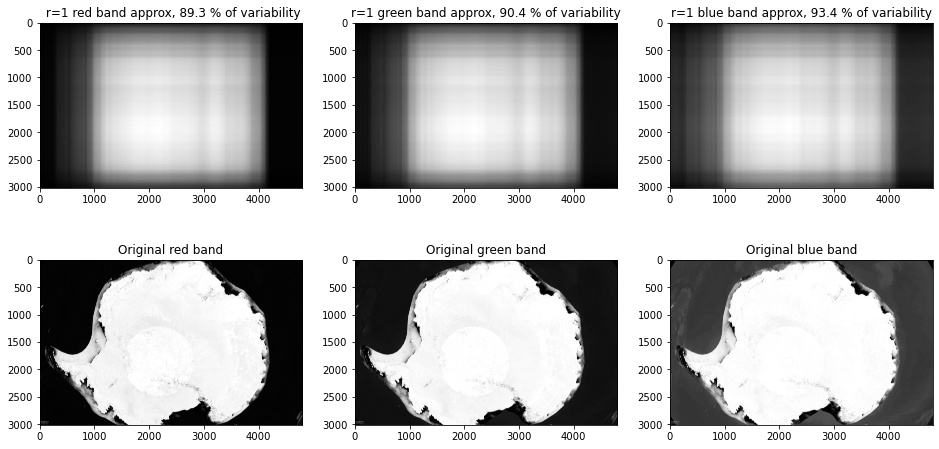

In [59]:
plt.figure(figsize=(16,8))
plt.subplot(2,3,1)
plt.imshow(Xr_red,cmap=cm.gray)
plt.title(' r=1 red band approx, ' + str(round(frac_r*100,1)) + ' % of variability')
plt.subplot(2,3,2)
plt.imshow(Xr_green,cmap=cm.gray)
plt.title('r=1 green band approx, ' + str(round(frac_g*100,1)) + ' % of variability')
plt.subplot(2,3,3)
plt.imshow(Xr_blue,cmap=cm.gray)
plt.title('r=1 blue band approx, ' + str(round(frac_b*100,1)) + ' % of variability')

plt.subplot(2,3,4)
plt.imshow(img_r,cmap=cm.gray)
plt.title('Original red band')
plt.subplot(2,3,5)
plt.imshow(img_g,cmap=cm.gray)
plt.title('Original green band')
plt.subplot(2,3,6)
plt.imshow(img_b,cmap=cm.gray)
plt.title('Original blue band');

So even with a rank 1 approximation, we're explaining over 89% of the variability in our image. But our approximations aren't really recognizable as Antarctica, so we're going to increase the rank. 

In [61]:
r = 10
Xr_red,frac_r = image_approximation(img_r, r, 1)
Xr_green,frac_g = image_approximation(img_g, r, 1)
Xr_blue,frac_b = image_approximation(img_b, r, 1)

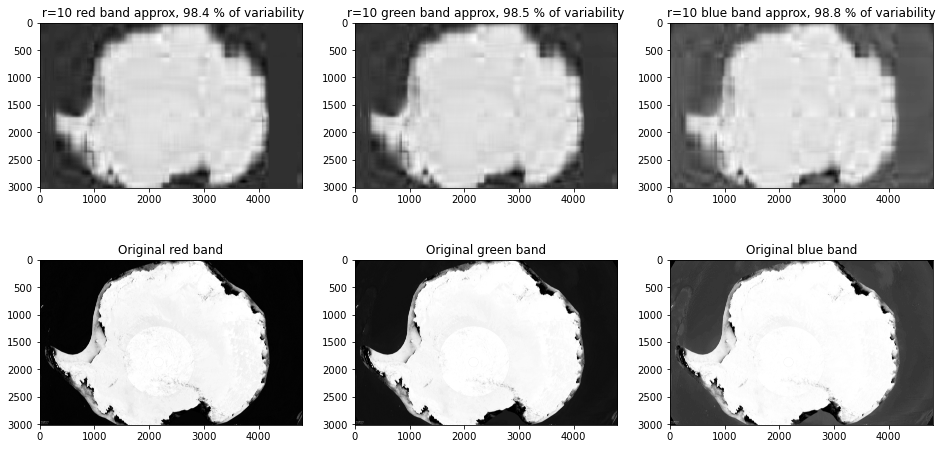

In [62]:
plt.figure(figsize=(16,8))
plt.subplot(2,3,1)
plt.imshow(Xr_red,cmap=cm.gray)
plt.title(' r=10 red band approx, ' + str(round(frac_r*100,1)) + ' % of variability')
plt.subplot(2,3,2)
plt.imshow(Xr_green,cmap=cm.gray)
plt.title('r=10 green band approx, ' + str(round(frac_g*100,1)) + ' % of variability')
plt.subplot(2,3,3)
plt.imshow(Xr_blue,cmap=cm.gray)
plt.title('r=10 blue band approx, ' + str(round(frac_b*100,1)) + ' % of variability')

plt.subplot(2,3,4)
plt.imshow(img_r,cmap=cm.gray)
plt.title('Original red band')
plt.subplot(2,3,5)
plt.imshow(img_g,cmap=cm.gray)
plt.title('Original green band')
plt.subplot(2,3,6)
plt.imshow(img_b,cmap=cm.gray)
plt.title('Original blue band');

It's starting to look like Antarctica. Let's try a rank 100 image reconstruction. This could take a while to run. 

In [64]:
r = 100
Xr_red,frac_r = image_approximation(img_r, r, 1)
Xr_green,frac_g = image_approximation(img_g, r, 1)
Xr_blue,frac_b = image_approximation(img_b, r, 1)

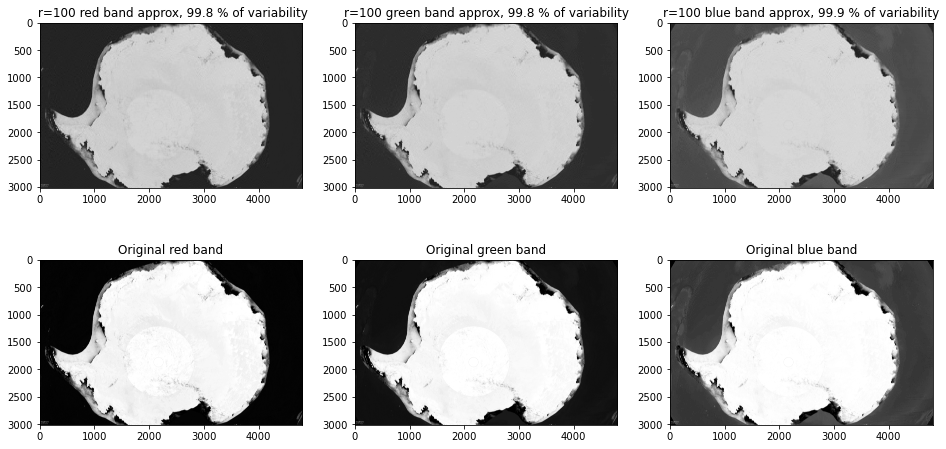

In [65]:
plt.figure(figsize=(16,8))
plt.subplot(2,3,1)
plt.imshow(Xr_red,cmap=cm.gray)
plt.title(' r=100 red band approx, ' + str(round(frac_r*100,1)) + ' % of variability')
plt.subplot(2,3,2)
plt.imshow(Xr_green,cmap=cm.gray)
plt.title('r=100 green band approx, ' + str(round(frac_g*100,1)) + ' % of variability')
plt.subplot(2,3,3)
plt.imshow(Xr_blue,cmap=cm.gray)
plt.title('r=100 blue band approx, ' + str(round(frac_b*100,1)) + ' % of variability')

plt.subplot(2,3,4)
plt.imshow(img_r,cmap=cm.gray)
plt.title('Original red band')
plt.subplot(2,3,5)
plt.imshow(img_g,cmap=cm.gray)
plt.title('Original green band')
plt.subplot(2,3,6)
plt.imshow(img_b,cmap=cm.gray)
plt.title('Original blue band');

This looks good, and we're explaining 99.8% of the variability in the image. Now we can stack our approximated bands together to form an rgb image and compare it to our original image. The PIL library can help us do this. However, `PIL.image.fromarray` is expecting data ranging from 0 to 255, and we have data outside of that range. So we need to rescale. Also, it is expecting data of type `uint8`. 

In [80]:
data_stack = np.stack([Xr_red,Xr_green,Xr_blue], axis=2)
print('Max of data_stack before rescaling: ', np.max(data_stack))
print('Min of data_stack before rescaling: ', np.min(data_stack))

# Determine bounding box
min_data, max_data = np.min(data_stack), np.max(data_stack)
# Determine interval
ds = max_data - min_data
# rescale data
data_stack -= min_data
data_stack /= (ds/255)

print('Max of data_stack after rescaling: ', np.max(data_stack))
print('Min of data_stack after rescaling: ', np.min(data_stack))

Max of data_stack before rescaling:  317.3147593792944
Min of data_stack before rescaling:  -48.47885710859255
Max of data_stack after rescaling:  255.0
Min of data_stack after rescaling:  0.0


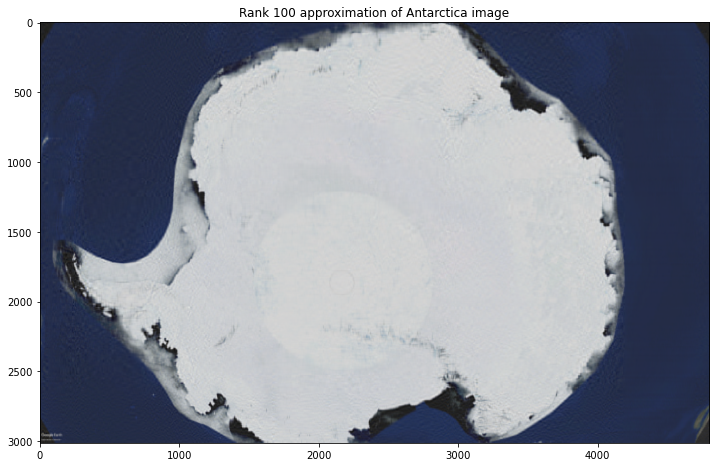

In [86]:
approx_img = PIL.Image.fromarray(data_stack.astype(np.uint8))
plt.figure(figsize= (12,12))
plt.imshow(approx_img);
plt.title('Rank 100 approximation of Antarctica image');

### Principal Component Analysis

#### What is PCA?

Principle Component Analysis is a widely used statistical technique that reduces the dimensionality of a dataset while preserving as much variability as possible (Jolliffe and Cadima, 2016). This method takes a dataset and finds new variables that are linear functions of those in the given dataset, such that the new variables maximize variance and are uncorrelated. 

One of the strengths of PCA is that it is a non-parametric method of analysis, and therefore is not reliant on *a priori* knowledge of the distribution of the data, or the structure of the underlying system (Schlens, 2005). 

#### The PCA process

Consider a dataset with n observations of p numerical variables, compiled into an n x p
data matrix $\mathbf{X}$, the jth column of which is a vector of observations on the jth variable (following the notation of Jolliffe and Cadima, 2016). The aim is to find a linear combination $\mathbf{X}a$ of the columns of $\mathbf{X}$ that has maximum variance, where $a$ is a vector of constants. We define the sample covariance matrix $S$ when computing the variance of the linear combination, $var(\mathbf{X}a) = a^T S a$. 

We usually require that the vectors $a$ have unit norms, $a^T a = 1$. Then, finding the linear combination with maximum variance is equivalent to solving the eigenvalue problem $Sa = \lambda a$. 

In this equation, $a$ and $\lambda$ are the eigenvector and corresponding eigenvalue of the covariance matrix $S$. Since the power of PCA lies in dimensionality reduction, it is typical to try and measure how much variance is explained by a given PC, or given set of PCs. Usually, a certain number of PCs are chosen based on what percentage of the total variability they explain. 

#### PCA, step by step
Applied to image data from Sentinel-2, the PCA methodology will generally follow the
following steps.
- Compose the data into a matrix with the correct dimensions, probably a 3D matrix
- Standardize the data by subtracting the mean and dividing by the standard deviation
- Compute the covariance matrix
- Compute the eigenvalues and eigenvectors of the matrix
- Create the appropriate linear combinations to obtain principal components

### Applying PCA to our satellite data

It is generally considered good practice to center the data before starting the PCA process. This means subtracting the mean of the data. 

In [87]:
for k in range((np.shape(data)[2])):
    data[:,:,k] = data[:,:,k] - np.mean(np.mean(data[:,:,k]))

Now let's compute the covariance matrix, as well as its eigenvalues and eigenvectors.

In [88]:
# computing covariance matrix
C = np.zeros((np.shape(data)[2],np.shape(data)[2])) # initialize array of zeros
for i in np.arange(0,np.shape(data)[2]): 
    for j in np.arange(0,np.shape(data)[2]):
        C[i,j] = np.mean(np.mean(data[:,:,i]*data[:,:,j]))
        
# computing eigenvalues and eigenvectors
[D,V] = np.linalg.eig(C)

Now to create our principal components. 

In [89]:
P = np.zeros([np.shape(data)[0],np.shape(data)[1],np.shape(data)[2]]);
for i in np.arange(0,np.shape(data)[2]):
    for j in np.arange(0,np.shape(data)[2]):
        P[:,:,j] = P[:,:,j] + V[i,j]*data[:,:,i]

We've computed our principal components - now to take a look at them. 

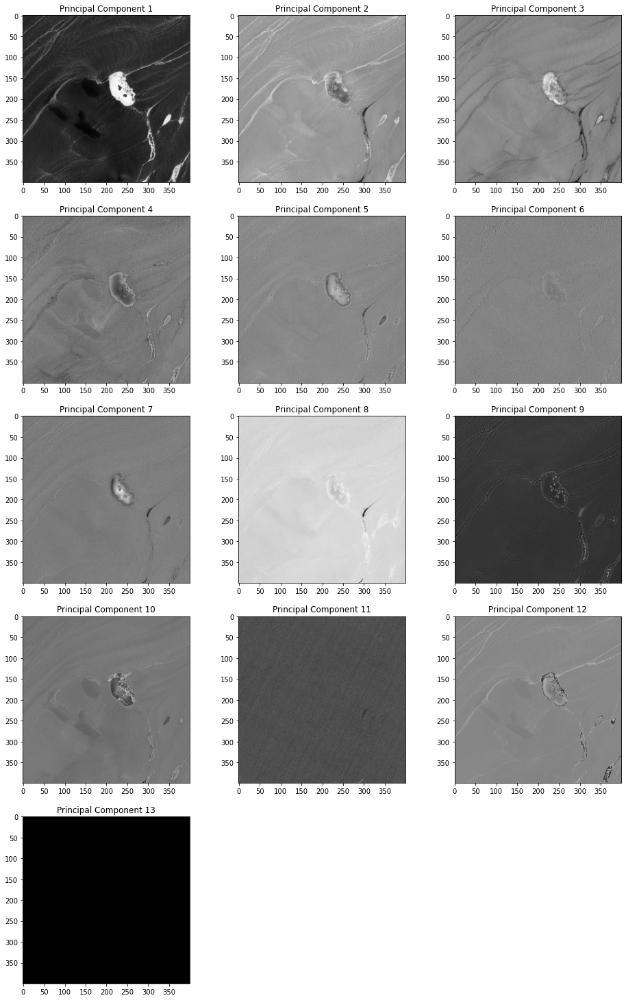

In [91]:
plt.figure(figsize=(16,26))
for i in range((np.shape(data)[2])):
    plt.subplot(5,3,i+1)
    plt.imshow(P[:,:,i],cmap=cm.gray,vmin=np.min(np.min(P[:,:,i])),vmax=np.max(np.max(P[:,:,i])))
    plt.title('Principal Component ' + str(i+1))

PC 1 is interesting - it shows a stark difference between the melt pond (in white) and the surrounding ice sheet. How might we get a rough estimate of melt pond surface area from this PC? 

PCs 7 and 8 also tell us something that may be physically meaningful. They differentiate between the melt pond (light colors) and the small dark area to the lower right of the melt pond. This may indicate to us that the dark area is not melt, but instead exposed rock or something else. 

#### Research limitations

Include statement about how this isn't enough for accurate estimates, etc. 

### References

1. 